In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt # grafikai
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns #kietesni grafikai

# scikit-learn clustering
from sklearn.cluster import KMeans #KMeans klasterizavimui
from sklearn.preprocessing import LabelEncoder #jei požymis būtų tekstas - reikia į skaičius paversti

from sklearn.model_selection import train_test_split 
from sklearn.datasets import make_blobs # pirmam klasterizavimo pavyzdžiui - kompiuteriu generuoti duomenys

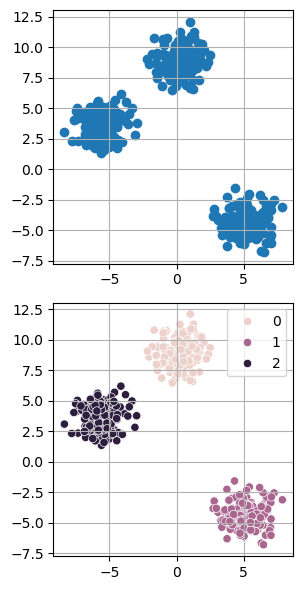

In [5]:
X,y = make_blobs(n_samples = 500,n_features = 2,centers = 3,random_state = 23) #susigeneruojam duomenis
#  mums reiks tik X, šiaip jau, 
# y - label'iai kiekvieno sample'o

fig, (axis, ax) = plt.subplots(2, gridspec_kw={'height_ratios':[1,1]}, figsize=[3,6])
#plotting code:
axis.grid(True)
axis.scatter(X[:,0], X[:,1])

sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=ax)
ax.grid(True)

fig.tight_layout()
plt.show()

Matyti, jog turime tris grupes duomenų, visos trys "gula" aplink kažkokį centrą.  

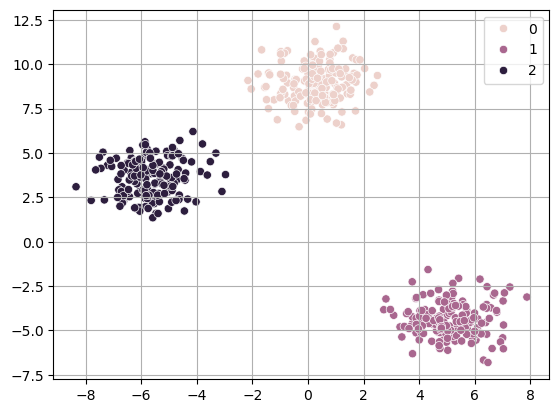

In [6]:
ax = sns.scatterplot(x=X[:,0], y=X[:,1], hue=y)
ax.grid(True)
plt.show()

Aukštesnis grafikas - vizualizacija, kas yra y - labeliai kiekvieno taško. Jų yra trys skirtingi. Ne esminis dalykas mums, bet parodo, kokį klasterizacijos rezultatą turėtumėme gauti.

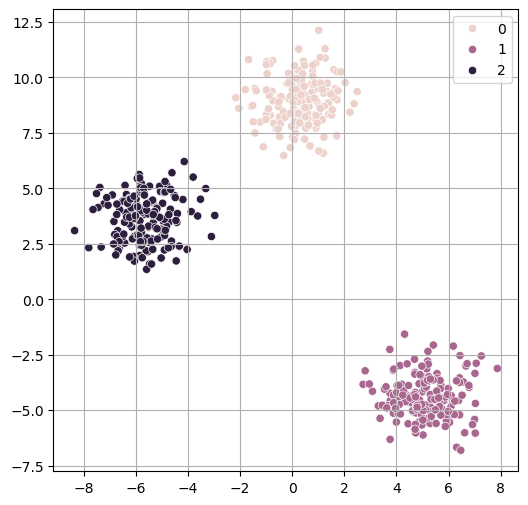

In [7]:
#  bandykime su sklearn'o KMeans aptikti klasterius.
kmeans = KMeans(n_clusters=3) # pasirenkame, jog norime trijų klasterių atsakyme
#  NOTE - sugeneruos 8nis kasterius - ryškiai per daug, jei naudojamos default vertės
predicted_labels = kmeans.fit_predict(X)

# vizualizacija:

fig, ax = plt.subplots(figsize=[6,6])
sns.scatterplot(x=X[:,0], y=X[:,1], hue=predicted_labels, ax=ax)
ax.grid(True)
plt.show()

Kaip pasirinkti teisingą klasterių kiekį?

In [8]:
import matplotlib as mpl
mpl.rc('axes.formatter', useoffset=False)
#mpl.use(backend='QtAgg')
mpl.rcParams.update({'font.size': 10})

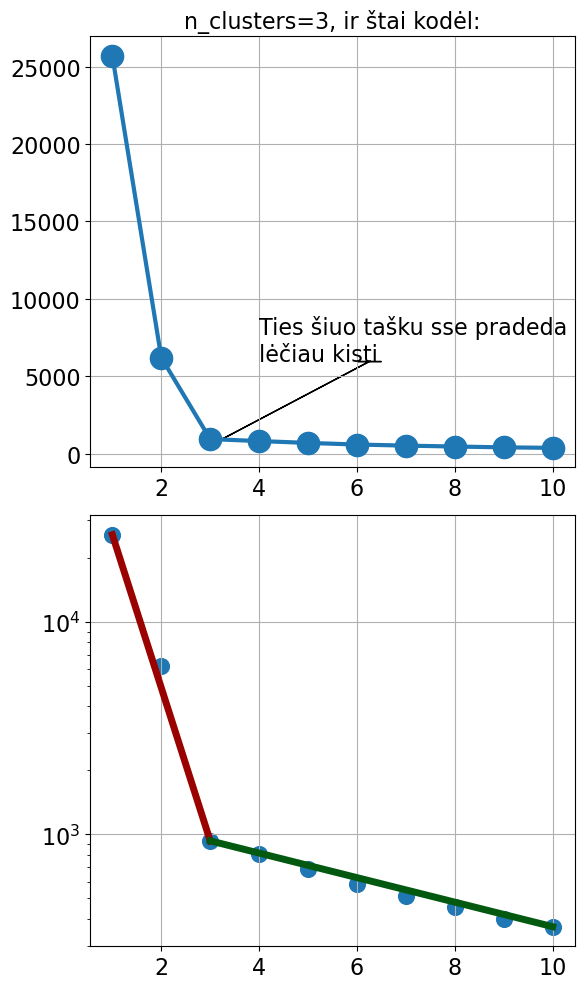

In [9]:

sse = [] #SUM OF SQUARED ERROR
for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit(X)
    sse.append(km.inertia_)
# print(sse)
x = range(1,11)
fig, (ax1, ax2) = plt.subplots(2, figsize=(6,10), gridspec_kw={'height_ratios':[1,1]})

#plotting code:
ax1.plot(x,sse, marker='o', lw=3, ms=16)
ax1.grid(True)
ax1.arrow(x=3.25,y=sse[2]+10, dx=3, dy=5000, head_width=0.5)
ax1.text(x=4.0,y=6000, s='Ties šiuo tašku sse pradeda\nlėčiau kisti', fontsize=16)
ax1.set_title("n_clusters=3, ir štai kodėl:", fontsize=16)
ax1.tick_params(axis='both', labelsize=16)

ax2.scatter(x,sse, marker='o', s=128)
ax2.set_yscale('log')
ax2.grid(True)
ax2.plot([1,3],[sse[0],sse[2]], color='xkcd:deep red', lw=5)
ax2.plot([3,10],[sse[2],sse[-1]], color='xkcd:deep green', lw=5)
ax2.tick_params(axis='both', labelsize=16)
#ax2.legend(loc='best')
fig.tight_layout()
plt.show()

Antrasis būdas:  
##### GridSearchCV

In [10]:
from sklearn.model_selection import GridSearchCV # su gridsearchcv tuninsime parametrus
# Define the parameter grid
param_grid = {
    'n_clusters': range(2, 6 + 1),
    'init': ['k-means++', 'random'],
    'n_init': [5, 10, 15],
    'max_iter': [100, 200, 300, 400, 500],
    'tol': [0.0001, 0.001, 0.01],
    'algorithm': ['auto', 'full', 'elkan'],
    'random_state': [0, 42, 100]
}

# Create the KMeans object
kmeans = KMeans(random_state=42)

# Perform grid search
grid_search = GridSearchCV(kmeans, param_grid=param_grid, cv=5, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X) # fitinam X, kurį susigeneravom darbo pradžioje

# Print the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)
print('Optimal number of clusters based on parameter grid: ' + str(grid_search.best_params_['n_clusters']))

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Best hyperparameters:  {'algorithm': 'auto', 'init': 'k-means++', 'max_iter': 100, 'n_clusters': 6, 'n_init': 10, 'random_state': 42, 'tol': 0.001}
Optimal number of clusters based on parameter grid: 6


DBSCAN

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans, DBSCAN
import seaborn as sns
import matplotlib.pyplot as plt
import math

In [2]:
def make_circle(r, n, noise = 30, seed = 1234):
  np.random.seed(seed)
  return [(math.cos(2*math.pi/n*x)*r+np.random.normal(-noise,noise), math.sin(2*math.pi/n*x)*r+np.random.normal(-noise,noise)) for x in range(1,n+1)]

small_circle = make_circle(100, 300, 10)
medium_circle = make_circle(300, 700, 20)
big_circle = make_circle(500, 1000, 30)

noise = [(np.random.randint(-600,600),np.random.randint(-600,600)) for i in range(300)]

<AxesSubplot: xlabel='x', ylabel='y'>

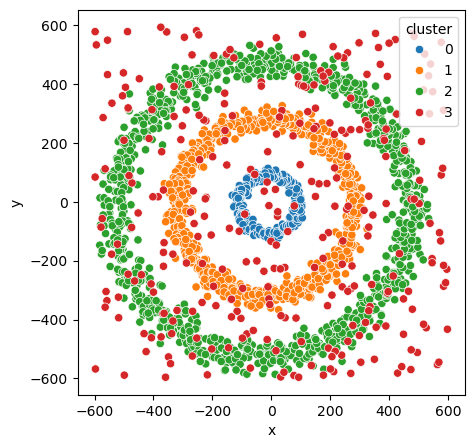

In [ ]:
def arrray_to_df(arr, i):
  df = pd.DataFrame(arr)
  df['cluster'] = str(i)
  return df

data = [arrray_to_df(arr, i) for i, arr in enumerate([small_circle, medium_circle, big_circle, noise])]

data = pd.concat(data)
data.columns = ['x', 'y', 'cluster']


plt.rcParams['figure.figsize'] = [5,5]
sns.scatterplot(
    data = data, 
    x = 'x',
    y = 'y',
    hue = 'cluster'
)
plt.show()

<AxesSubplot: xlabel='x', ylabel='y'>

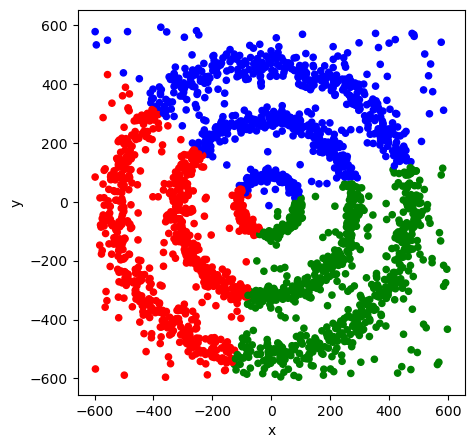

In [4]:
preds = KMeans(n_clusters = 3, random_state =123).fit_predict(data)

cols = { 
  0: 'r',
  1: 'g',
  2: 'b'
}

data['kmeans_pred'] = [cols.get(pred) for pred in preds]
data.plot.scatter('x', 'y', c='kmeans_pred')

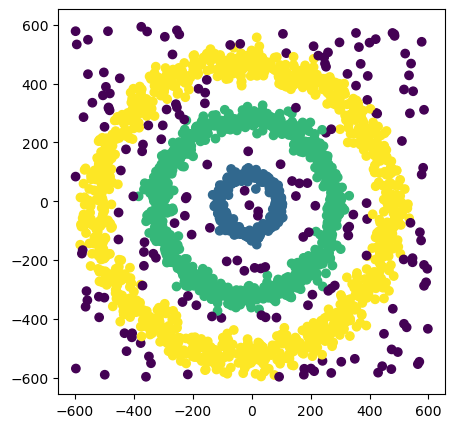

In [10]:
data['dbscan'] = DBSCAN(eps=32, min_samples=5).fit_predict(data[['x', 'y']])

plt.scatter(
    data['x'],
    data['y'],
    c = data['dbscan']
)

In [16]:
from LKS94WGS84 import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns

In [17]:
df = pd.read_json(path_or_buf='https://data.gov.lt/media/filer_public/5e/b8/5eb89d55-f57a-48ec-b1a2-063692c1b6a7/ei_2022_12_31.json', convert_dates=['dataLaikas'])
df = df[['dataLaikas', 'iskaitinis','dalyviuSkaicius','rusis', 'ilguma','platuma']].dropna(subset=['ilguma','platuma'])

In [18]:
LAT, LON = [],[]

for ilguma, platuma in zip(df['ilguma'],df['platuma']):
    lat, lon = grid2geo(platuma, ilguma)
    LAT.append(lat)
    LON.append(lon)

df['long'] = LON
df['lat'] = LAT

In [19]:
import plotly.express as px

In [20]:
# df.query('rusis == "Užvažiavimas ant gyvūno"', inplace=True)

In [21]:
fig = px.scatter_mapbox(data_frame=df, lat='lat', lon='long', zoom=6)
fig.update_layout(mapbox_style="open-street-map") # open-street-map, carto-darkmatter
fig.update_layout(width=800, height=600)
fig.show()

In [22]:
kmeans = KMeans(n_clusters=10)

predicted_labels = kmeans.fit_predict(df[['lat','long']])

df['kmeans'] = predicted_labels
def fx(x):
    d = str(x)
    return f'{d:0>4}'

df['kmeans'] = df['kmeans'].apply(fx)
category_orders = sorted(df['kmeans'].value_counts().sort_index(ascending=True).index.tolist())

fig = px.scatter_mapbox(data_frame=df, lat='lat', lon='long', zoom=6, color='kmeans', category_orders={'kmeans':category_orders})
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(width=800, height=600)
fig.show()

In [23]:
# kiek kmeans klasterių yra optimalu?
sse = [] #SUM OF SQUARED ERROR
n = 88
for i in range(1,n):
    km = KMeans(n_clusters=i)
    km.fit_predict(df[['lat','long']])
    print(f'Skaičiuojamas žingsnis {i:<2}, liko dar {n-i-1:<2}', end='\r')
    sse.append(km.inertia_)
# print(sse)

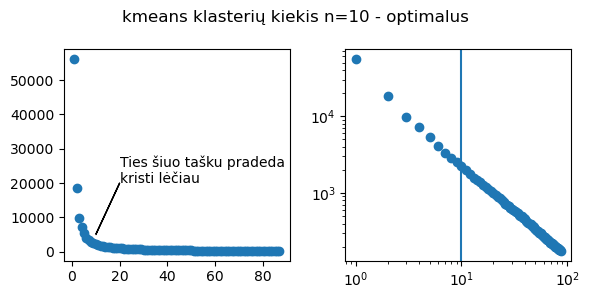

In [24]:
x = np.arange(1,n)
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(6,3), gridspec_kw={'width_ratios':[1,1]})
#ax1:
#plotting code:
ax1.scatter(x,sse)
ax1.arrow(20,20000, -10,-15000)
ax1.text(20,20000, "Ties šiuo tašku pradeda\nkristi lėčiau")

#ax1.legend(loc=1)
#ax2:
#plotting code:
ax2.scatter(x,sse)
ax2.set_yscale('log')
ax2.set_xscale('log')
ax2.axvline(10)

#ax2.legend(loc='best')
fig.suptitle("kmeans klasterių kiekis n=10 - optimalus")
fig.tight_layout()
plt.show()

In [25]:
df.head(2)

,dataLaikas,iskaitinis,dalyviuSkaicius,rusis,ilguma,platuma,long,lat,kmeans
0,2021-12-31 22:00:00,0,1.0,Kiti eismo įvykiai,6083759.0,491606.0,23.869164,54.889850,0004
1,2022-01-01 00:40:00,0,2.0,Susidūrimas,6181902.0,317439.0,21.092653,55.737249,0003


In [26]:
df['long_n'] = df['long']/df['long'].max()
df['lat_n'] = df['lat']/df['lat'].max()

In [27]:
df.head()

,dataLaikas,iskaitinis,dalyviuSkaicius,rusis,ilguma,platuma,long,lat,kmeans,long_n,lat_n
0,2021-12-31 22:00:00,0,1.0,Kiti eismo įvykiai,6083759.0,491606.0,23.869164,54.889850,0004,0.885366,0.972567
1,2022-01-01 00:40:00,0,2.0,Susidūrimas,6181902.0,317439.0,21.092653,55.737249,0003,0.782378,0.987582
2,2022-01-01 02:02:00,0,1.0,Užvažiavimas ant gyvūno,6161589.0,333263.0,21.356655,55.560661,0003,0.792171,0.984453
3,2022-01-01 01:53:00,0,1.0,Apvirtimas,6104844.0,630436.0,26.041968,55.062240,0005,0.965960,0.975622
4,2021-12-31 12:35:00,0,1.0,Užvažiavimas ant kliūties,6102529.0,495530.0,23.930034,55.058543,0004,0.887624,0.975556


In [28]:
df['dbscan'] = DBSCAN(eps=0.001, min_samples=15).fit_predict(df[['lat_n', 'long_n']])

def fx(x):
    d = str(x)
    return f'{d:0>4}'



df['dbscan'] = df['dbscan'].apply(fx)
category_orders = sorted(df['dbscan'].value_counts().sort_index(ascending=True).index.tolist())

fig = px.scatter_mapbox(data_frame=df, lat='lat', lon='long', zoom=6, color='dbscan', category_orders={'dbscan':category_orders})
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(width=800, height=600)
fig.show()


In [29]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

In [30]:
# paros laiko atranka:
df['h'] = df['dataLaikas'].dt.round('H').dt.hour

In [31]:
df['rusis'].value_counts()

rusis
Susidūrimas                                     5319
Užvažiavimas ant gyvūno                         4927
Susidūrimas su stovinčia transporto priemone    4799
Kiti eismo įvykiai                              4235
Užvažiavimas ant kliūties                       1949
Užvažiavimas ant pėsčiojo                        843
Apvirtimas                                       663
Susidūrimas su dviračiu                          561
Susidūrimas su motociklu                         121
Susidūrimas su mopedu                             62
Susidūrimas su bėgine transporto priemone          4
Name: count, dtype: int64

#### LogisticRegression

In [32]:
# ar galima atspėti pagal koordinantes bei paros laiką, ar tai buvo
#  susidūrimas su gyvūnu?
def labelize(x):
    if str(x) == "Užvažiavimas ant gyvūno":
        return 1
    else:
        return 0

df['labels'] = df['rusis'].apply(labelize)

In [33]:
df.head()

,dataLaikas,iskaitinis,dalyviuSkaicius,rusis,ilguma,platuma,long,lat,kmeans,long_n,lat_n,dbscan,h,labels
0,2021-12-31 22:00:00,0,1.0,Kiti eismo įvykiai,6083759.0,491606.0,23.869164,54.889850,0004,0.885366,0.972567,0000,22,0
1,2022-01-01 00:40:00,0,2.0,Susidūrimas,6181902.0,317439.0,21.092653,55.737249,0003,0.782378,0.987582,0001,1,0
2,2022-01-01 02:02:00,0,1.0,Užvažiavimas ant gyvūno,6161589.0,333263.0,21.356655,55.560661,0003,0.792171,0.984453,00-1,2,1
3,2022-01-01 01:53:00,0,1.0,Apvirtimas,6104844.0,630436.0,26.041968,55.062240,0005,0.965960,0.975622,00-1,2,0
4,2021-12-31 12:35:00,0,1.0,Užvažiavimas ant kliūties,6102529.0,495530.0,23.930034,55.058543,0004,0.887624,0.975556,0000,13,0


In [34]:
from sklearn.model_selection import train_test_split
data = df[['long_n','lat_n', 'h']]
target = df['labels']
x_train, x_test, y_train, y_test = train_test_split(data, target,test_size=0.35, random_state=20)

In [35]:
from sklearn.linear_model import LogisticRegression
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
logisticRegr.fit(x_train, y_train)
predictions = logisticRegr.predict(x_test) #entire dataset
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)

0.7886861313868613


In [36]:
from sklearn import metrics
from sklearn.metrics import roc_curve, auc

In [37]:
cm = metrics.confusion_matrix(y_test, predictions)
print(cm)

[[6483    0]
 [1737    0]]


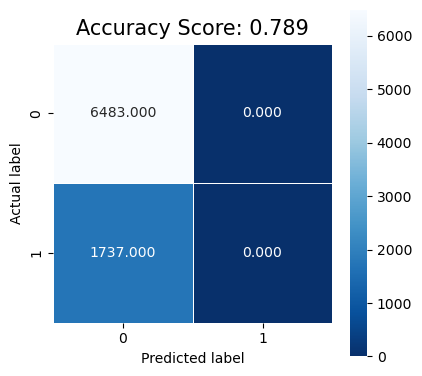

In [38]:
plt.figure(figsize=(4.5,4.5))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0:.3f}'.format(score)
plt.title(all_sample_title, size = 15);

#### ROC ir AUC

In [39]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, predictions) 
roc_auc = auc(fpr, tpr)
print(fpr, tpr)

[0. 1.] [0. 1.]


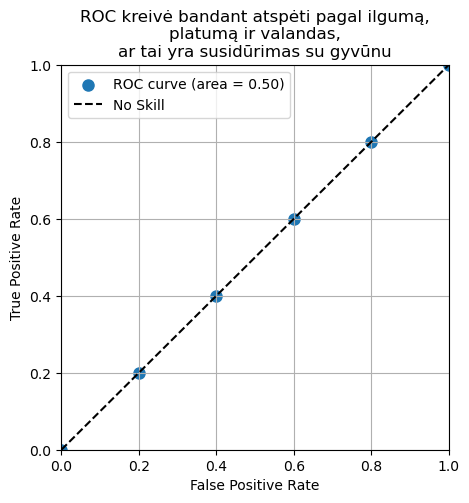

In [40]:
# Plot the ROC curve
plt.figure()  
fpr_l = np.linspace(fpr[0], fpr[1], num=6) # fpr, tpr vertės tik du taškai 0, 1
#  tad su linspace pasidarom daugiau taškų, kad vaizdžiau būtų:
tpr_l = np.linspace(tpr[0], tpr[1], num=6)
plt.scatter(fpr_l, tpr_l, s=64, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()
plt.title('ROC kreivė bandant atspėti pagal ilgumą,\nplatumą ir valandas,\nar tai yra susidūrimas su gyvūnu')
plt.legend()
plt.show()

#### DBSCAN su gridsearchcv

In [ ]:
# https://en.wikipedia.org/wiki/Silhouette_(clustering) 

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import sqlite3
import mysql.connector as cnt
import plotly.express as px



from sklearn.datasets import fetch_california_housing
california = fetch_california_housing() # naudojame sklearn db apie kalifornijos namų rinką

# sklearn datasetą į pandas df konvertuojam:

df = pd.DataFrame(california.data, columns=california.feature_names) # stulpelių pavadinimai - feature_names
df['target'] = pd.Series(california.target) # prisidedam target stulpelį

In [42]:
df.head(2) #apžvalga

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.02381,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.97188,2401.0,2.109842,37.86,-122.22,3.585


In [43]:
latlong = df[['Latitude', 'Longitude']]

fig = px.scatter_mapbox(data_frame=latlong, lat='Latitude', lon='Longitude', zoom=4)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(width=800, height=600)
fig.show()

In [44]:
X = latlong.to_numpy() # duomenis, kurios fitinsime su DBSCAN

from sklearn.cluster import DBSCAN

dbm = DBSCAN()

predictions = dbm.fit(X) # fitinam koordinantes

df['cluster'] = predictions.labels_ # prisidedam naują stulpelį su predicted cluster labels

fig = px.scatter_mapbox(data_frame=df, lat='Latitude', lon='Longitude', color='cluster', zoom=4)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(width=800, height=600)
fig.show()

Vienas didelis klasteris - so far so bad :)  
Kad būtų geriau - reikia tiuninguoti hiperparametrus - minimum ε ir min_samples (MinPts)

In [45]:
dbm = DBSCAN(eps=0.2,min_samples=20) # modifikavom ε ir minPts

predictions = dbm.fit(X) # fitinam koordinantes

df['cluster'] = predictions.labels_ # prisidedam naują stulpelį su predicted cluster labels

fig = px.scatter_mapbox(data_frame=df, lat='Latitude', lon='Longitude', color='cluster', zoom=4)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(width=800, height=600)
fig.show()

Better.

Kaip įvertinti, ar mūsų taškai yra geruose klasteriuose? 
#### Silhouette Score

In [46]:
from sklearn.metrics import silhouette_score as shs

shs(X,df['cluster']) # surandame Average Silhouette Score

0.35580754683795135

Ar galime pasigerinti score? --> GridSearchCV!

In [47]:
epsilon = np.linspace(0.01, 1, num = 20) # ε vertės
min_samples = np.arange(2,25,step=2) # MinPts vertės

Note: čia bus testuojama 240 kombinacijų - trunka ilgai (ca 16 min!).   

gridsearchcv prašo parametro scoring - nurodykime accuracy, nes  
DBSCAN neturi score, scoring atributų.

In [48]:
# dabar implementuojam gridsearchcv:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'eps':epsilon,
    'min_samples':min_samples
}
dbscn = DBSCAN()
grid_search = GridSearchCV(dbscn, param_grid, scoring='accuracy')
grid_search.fit(X)

best_eps = grid_search.best_params_['eps']
best_min_samples = grid_search.best_params_['min_samples']

print(best_eps, best_min_samples, sep='\n')

0.01
2


In [49]:
# pritaikykime gautus parametrus:

dbm = DBSCAN(eps=best_eps,min_samples=best_min_samples) # modifikavom ε ir minPts

predictions = dbm.fit(X) # fitinam koordinantes

df['cluster'] = predictions.labels_ # prisidedam naują stulpelį su predicted cluster labels

fig = px.scatter_mapbox(data_frame=df, lat='Latitude', lon='Longitude', color='cluster', zoom=4)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(width=800, height=600)
fig.show()

In [50]:
shs(X,df['cluster']) # surandame Average Silhouette Score

0.02943451274655726

#### Oh fcuk ...

Very advanced:  
pabandom pasidaryti savo gridsearch'ą, kur ieškotume geriausių parametrų  
pagal silhouette score

In [51]:
def GridSearch(combinations, X):
    '''
    Čia combinations - visos galimos epsilon ir minPts kombinacijos, kurias norime tikrinti
    X - data, kurią fitiname
    '''
    scores = [] # čia dėsime shs score
    all_labels = [] # čia dėsime predited labels
    for i, (eps, num_samples) in enumerate(combinations):
        predictions = DBSCAN(eps=eps, min_samples=num_samples).fit(X)
        labels = predictions.labels_
        # ir klasterių pavadinimus: (jie gali kartotis, tad pasidarome set'ą - unikalių verčių sąrašą)
        clusters = list(set(labels))
        # randam klasterių kiekį:
        clusters_count = len(clusters)
        if -1 in clusters: # -1 žymimas noise, vadinasi, klasterių yra vienu mažiau, nei unikalių laibelių
            clusters_count = clusters_count - 1                      
        if (clusters_count < 2) and (clusters_count > 25): # jei rado mažiau nei 2 klasterius - blogai, turime dėmę
            # o viršutinė riba 25 - apsiribojame, kad nepridarytų belekiek klasterių, kas rodytų overfitinimą
            scores.append(-20)
            all_labels.append('Poor values')
            print(f'{i:4} iteracija skipinta', end='\r')
            continue
        if len(labels) > 2: # jei labelių bus 1 - silhouette fails, negalima toliau eiti
            try:
                scores.append(shs(X,labels))
                all_labels.append(labels)
                print(f'{i:4} iteracija pridėta', end="\r")
            except Exception as ex:
                print(f'{i:4} iteracija skipinta, klaida {ex}', end='\r')
    best_index = np.argmax(scores)
    best_params = combinations[best_index]
    best_labels = all_labels[best_index]
    best_score = scores[best_index]
    return {'eps':best_params[0], 'minPts':best_params[1],'labels':best_labels, 'score':best_score}


import itertools

combinations = list(itertools.product(epsilon,min_samples))

bp = GridSearch(combinations,X)

In [52]:
for k,v in bp.items():
    print(k,v, sep = '\t')

eps	0.32263157894736844
minPts	18
labels	[0 0 0 ... 0 0 0]
score	0.6569767288251819


In [53]:
# pritaikykime gautus parametrus:

dbm = DBSCAN(eps=bp['eps'],min_samples=bp['minPts']) # modifikavom ε ir minPts

predictions = dbm.fit(X) # fitinam koordinantes

df['cluster'] = predictions.labels_ # prisidedam naują stulpelį su predicted cluster labels

fig = px.scatter_mapbox(data_frame=df, lat='Latitude', lon='Longitude', color='cluster', zoom=4)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(width=800, height=600)
fig.show()

better ... 